## Análise de Tiroteios no RJ
### Trabalho da Pós em Arquitetura de Software

Este projeto utiliza dados públicos da API do Fogo Cruzado para analisar padrões de tiroteios e as vítimas na cidade do Rio de Janeiro.

### Objetivo

Identificar o risco de dado um tiroteio possa ter vítimas baseado em horário do dia, local e dia da semana.

In [1]:
#Importação das bibliotecas necessárias
import numpy as np
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from pickle import dump
from pickle import load
import folium
from folium.plugins import MarkerCluster
from branca.element import Template, MacroElement
from sklearn.metrics import classification_report, RocCurveDisplay, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier


### Funções para tratamento dos dados

Para categoriazar melhor os dados foi pensado em usar o campo data e montarmos a recorrência.
- A partir da hora tiramos a madrugada, manhã, tarde e noite (1-4)
- Dia da semana
-  Mês
<br>

**Serão utilizados os dados de latitude e longitude para a localização.**
<br>

**Para avaliação será recuperado o dado de vítima**
- quantidade de vítimas para cada evento de tiroteio (Feridos + Mortos)
- quantidade de mortos para cada evento de tiroteio
<br>

**A gravidade será calculada da seguinte maneira:**
- Sem Vítimas
- Sem Mortes (somente 1 ou mais feridos)
- Com mortes (com 1 ou mais mortes, com 0 ou mais feridos)

In [2]:
# Funções para tratamento dos dados
def periodo_do_dia(h):
    """
    Recebe um horário em formato de 24 horas (0-23) e retorna o período do dia:
    Arguments:
    h -- Hora no formato 0-23
    Returns:
    1 - madrugada (00:00-05:59)
    2 - manhã (06:00-11:59)
    3- tarde (12:00-17:59)
    4 - noite (18:00-23:59)
    """
    if h < 6: return 1
    elif h < 12: return 2
    elif h < 18: return 3
    else: return 4

def quantidade_vitimas_mortas(vitimas):
    """ Conta o número de vítimas mortas em uma lista de vítimas."""
    return contar_por_status(vitimas, 'Dead')

def parse_vitimas(v):
        """Converte uma string ou dicionário de vítimas em uma lista de vítimas."""
        if isinstance(v, str) and v.strip().startswith('['):
            try:
                return ast.literal_eval(v)
            except (ValueError, SyntaxError):
                return []
        return v if isinstance(v, list) else []

def contar_por_status(vitimas, status):
    """Conta o número de vítimas com um determinado status em uma lista de vítimas."""
    if not isinstance(vitimas, list):
        return 0
    return sum(1 for vit in vitimas if vit.get('situation') == status)

def classificar_gravidade(vitimas, mortos):
    """Classifica a gravidade de um evento com base no número de vítimas e mortos."""
    if vitimas == 0:
        return 'sem_vitima'
    elif mortos == 0:
        return 'ferido'
    else:
        return 'mortos'


In [3]:
#Leitura dos dados Atualmente marcados até a data
url = "https://raw.githubusercontent.com/cjcnetto/meus-mapas-api/main/MachineLearning/data/tiroteios_RJ.csv"
colunas = ['latitude', 'longitude', 'policeAction', 'date', 'victims']
dataset = pd.read_csv(url, usecols=colunas, skiprows=0, delimiter=',', encoding='utf-8-sig')

# Classificando os dados

#tratando os dados de vitimas
dataset['victims'] = dataset['victims'].apply(parse_vitimas)
dataset['total_victims'] = dataset['victims'].apply(lambda v: len(v) if isinstance(v, list) else 0)
dataset['deaths'] = dataset['victims'].apply(quantidade_vitimas_mortas)
#Tratando os dados temporais, vamos recuperar as frequenciais semanais e mensais e o periodo do dia em que o tiroteio ocorreu
dataset['date'] = pd.to_datetime(dataset['date'])
dataset['weekday'] = dataset['date'].apply(lambda date: date.weekday())
dataset['month'] = dataset['date'].dt.month
dataset['period'] = dataset['date'].dt.hour.apply(periodo_do_dia)
dataset['gravidade'] = dataset.apply(lambda row: classificar_gravidade(row['total_victims'], row['deaths']), axis=1)

#tratando os dados de localização que estavam em formato de dicionário, recuperando somente o nome
dataset.drop(['victims', 'date'], axis=1, inplace=True)
nova_ordem = ['policeAction', 'weekday', 'month', 'period', 'latitude', 'longitude', 'total_victims', 'deaths', 'gravidade']
dataset = dataset[nova_ordem]
dataset.head()


# Filtra somente eventos com ação policial
df_filtrado = dataset[dataset['policeAction'] == True].copy()

### Análise dos dados
Como podemos notar aqui  temos a maioria absoluta sem vitimas

| Tipo de Ocorrência | Critério               | Quantidade | Representação           |
| ------------------ | ---------------------- | ---------- | ----------------------- |
| Sem vítimas        | `total_victims == 0`   | **21.239** | 🟥 **Maioria absoluta** |
| 1 vítima           | `total_victims == 1`   | 3.945      | 🟧 Muito frequente      |
| 2 a 3 vítimas      | `total_victims == 2–3` | 1.539      | 🟨 Moderado             |
| 4 ou mais vítimas  | `total_victims >= 4`   | 320        | 🟩 Raro  |


| Número de Mortes | Critério        | Quantidade | Representação                 |
| ---------------- | --------------- | ---------- | ----------------------------- |
| Sem mortes       | `deaths == 0`   | **24.014** | 🟩 **Majoritário**            |
| 1 morte          | `deaths == 1`   | 2.365      | 🟨 Alta frequência relativa   |
| 2 a 3 mortes     | `deaths == 2–3` | 570        | 🟧 Ocorrência moderada        |
| 4 ou mais mortes | `deaths >= 4`   | 94         | 🟥 **Raríssimo, mas crítico** |

Baseado nessa ideia foi criado um algoritmo para definir e aplicar um fator de gravidade.

| Categoria atribuída | Condição                      | Significado prático              | Contagem | Percentual (%) |
| ------------------- | ----------------------------- | -------------------------------- | -------- | -------------- |
| `sem_vitima`        | `vitimas == 0`                | Nenhum ferido ou morto           | 21.239   | 78,54%         |
| `ferido`            | `mortos == 0 and vitimas > 0` | Evento com apenas feridos        | 2.775    | 10,26%         |
| `mortos`            | `mortos > 0`                  | Eventos com pelo menos uma morte | 3.029    | 11,20%         |


A mesma se encontra bem desbalanceada tendo o número de tiroteios sem vítimas altíssimo.

#### Contagem dos dados

In [4]:
dataset['total_victims'].value_counts().sort_index()

,count
total_victims,
0,21239
1,3945
2,1136
3,403
4,171
5,59
6,35
7,21
8,11


In [ ]:
(dataset['deaths'].value_counts(normalize=False)
         .sort_index()
         .to_frame('contagem')
         .assign(percentual=lambda df: (df['contagem'] / df['contagem'].sum() * 100).round(2)))

,contagem,percentual
deaths,,
0,24014,88.80
1,2365,8.75
2,428,1.58
3,142,0.53
4,49,0.18
5,14,0.05
6,13,0.05
7,7,0.03
8,3,0.01


In [ ]:
(dataset['gravidade'].value_counts(normalize=False)
         .sort_index()
         .to_frame('contagem')
         .assign(percentual=lambda df: (df['contagem'] / df['contagem'].sum() * 100).round(2)))

,contagem,percentual
gravidade,,
ferido,2775,10.26
mortos,3029,11.20
sem_vitima,21239,78.54


### Redução de Escopo

Reduzindo o escopo para uma melhor distribuição, será considerado somente os tiroteios onde existe envolvimento de ação policial.

A partir dessa classificação foi notada essa distribuição

|gravidade|contagem|percentual|
|---|---|---|
|ferido|1937|25\.84|
|mortos|1483|19\.78|
|sem\_vitima|4076|54\.38|

Nesse ponto temos uma distribuição melhor dos dados. Logo faremos um filtro no nosso dataset.

In [5]:
# Função para gerar os gráficos
def plotar_distribuicao_gravidade_dupla(colunas_analise, dataset, titulo='Total'):
    for coluna in colunas_analise:
        tabela = pd.crosstab(dataset[coluna], dataset['gravidade'])

        ax = tabela.plot(kind='bar', stacked=True, colormap='Greens', figsize=(10, 6))
        ax.set_title(f'Distribuição por {coluna.capitalize()} - {titulo}')
        ax.set_xlabel(coluna.capitalize())
        ax.set_ylabel('Ocorrências')
        ax.legend(title='Gravidade', bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        plt.tight_layout()
        plt.show()

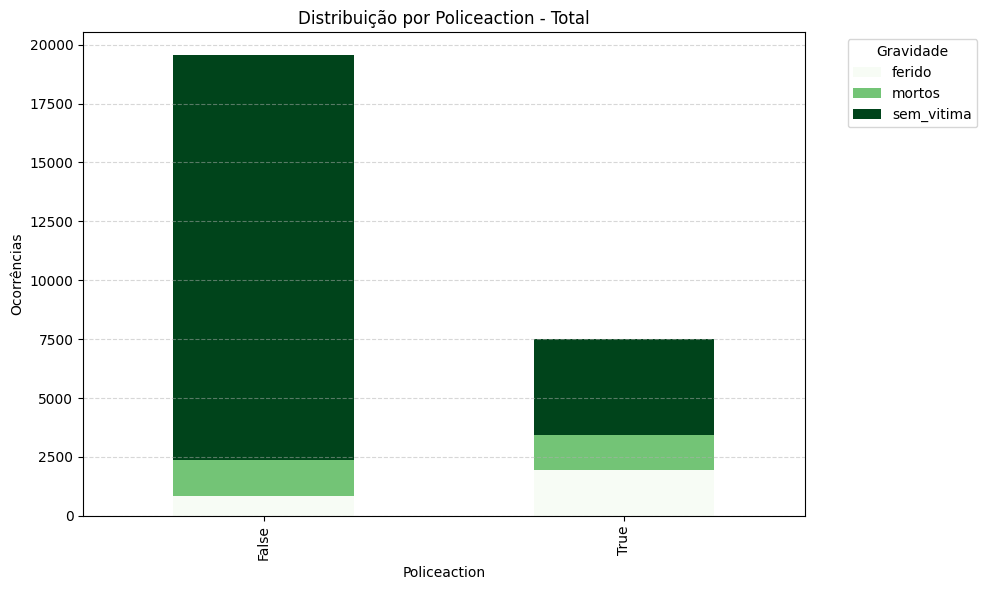

,contagem,percentual
gravidade,,
ferido,1937,25.84
mortos,1483,19.78
sem_vitima,4076,54.38


In [ ]:
# Lista das colunas categóricas a serem analisadas
analise_global = ['policeAction']

plotar_distribuicao_gravidade_dupla(analise_global, dataset)

(dataset[dataset['policeAction'] == True]['gravidade'].value_counts(normalize=False)
         .sort_index()
         .to_frame('contagem')
         .assign(percentual=lambda df: (df['contagem'] / df['contagem'].sum() * 100).round(2)))


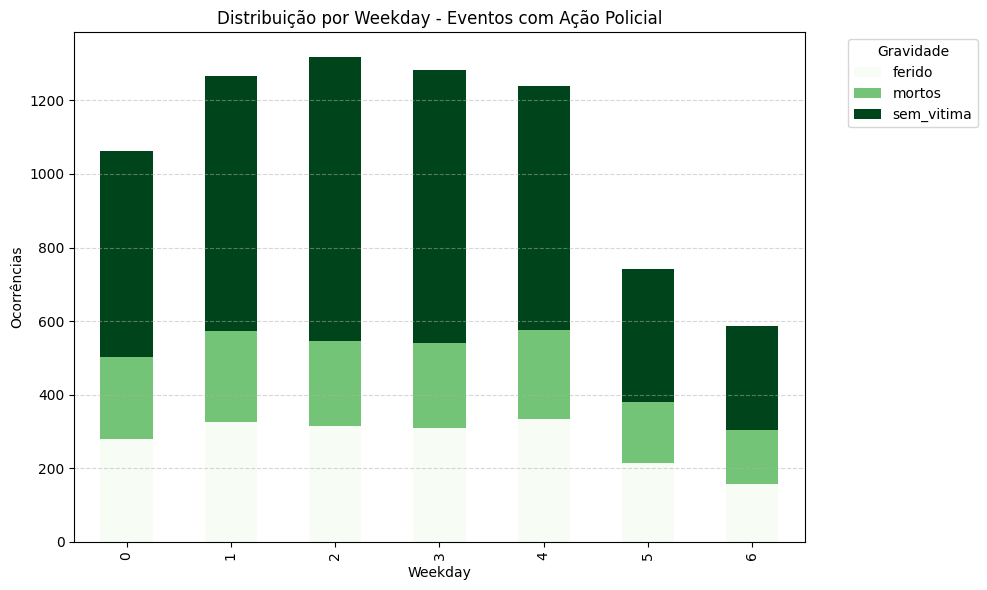

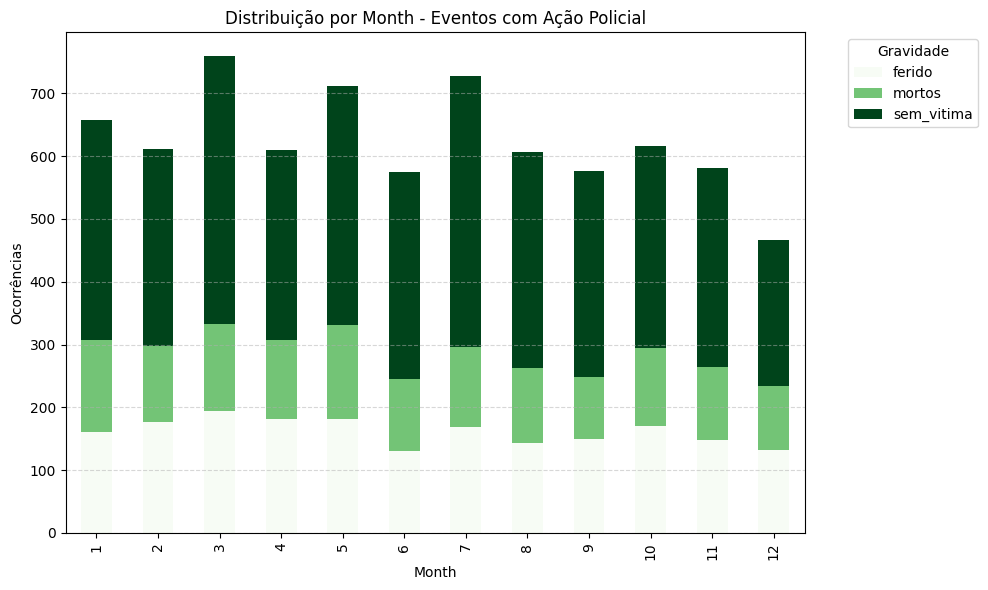

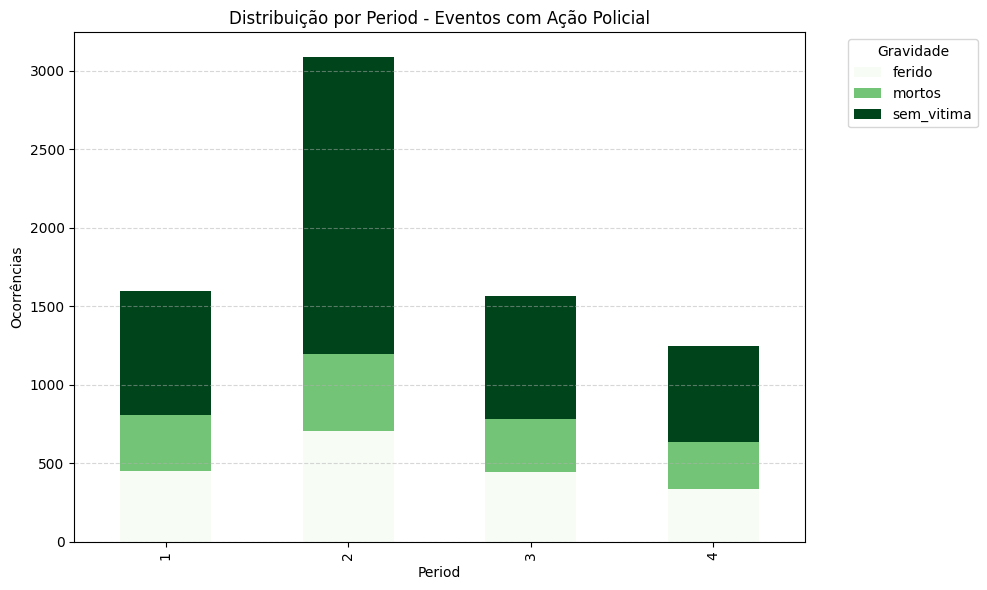

In [ ]:
# Lista de colunas categóricas a analisar
analise_filtrada = ['weekday', 'month', 'period']

plotar_distribuicao_gravidade_dupla(analise_filtrada, df_filtrado, titulo='Eventos com Ação Policial')

In [ ]:
# Cores por tipo de gravidade
cores_gravidade = {
    'Com mortos': 'black',
    'Sem mortos': 'orange',
    'Sem vítimas': 'green'
    }

# Filtrar dados válidos
df_mapa = df_filtrado.dropna(subset=['latitude', 'longitude', 'gravidade'])

# Criar o mapa centrado no RJ
mapa = folium.Map(location=[-22.9, -43.2], zoom_start=11, tiles='OpenStreetMap', width='80%',height='500px')

# Cluster para aglomerar pontos
cluster = MarkerCluster().add_to(mapa)

# Adicionar os marcadores
for _, row in df_mapa.iterrows():
    grav = row['gravidade']
    cor = cores_gravidade.get(grav, 'gray')
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5 + row['total_victims'] * 0.5,  # Tamanho do círculo proporcional ao número de vítimas
        color=cor,
        fill=True,
        fill_opacity=0.7,
        popup=f"Gravidade: {grav}<br>Latitude: {row['latitude']}<br>Longitude: {row['longitude']}<br>Período: {row['period']}"
    ).add_to(cluster)

# Legenda HTML (customizada)
legenda_html = """
{% macro html(this, kwargs) %}
<div style="
    position: fixed;
    top: 90px;
    left: 20px;
    width: 180px;
    height: 100px;
    background-color: white;
    border:2px solid grey;
    z-index:9999;
    font-size:14px;
    padding: 10px;
    box-shadow: 2px 2px 5px rgba(0,0,0,0.3);
">
<b>Legenda - Gravidade</b><br>
<span style="color:green;">●</span> sem_vitima<br>
<span style="color:orange;">●</span> ferido<br>
<span style="color:black;">●</span> mortos<br>
</div>
{% endmacro %}
"""

# Adiciona ao mapa
legenda = MacroElement()
legenda._template = Template(legenda_html)
mapa.get_root().add_child(legenda)

# Mostrar o mapa
mapa



### Análise dos modelos



In [6]:
np.random.seed(7) # definindo uma semente global
seed = 7 # semente aleatória

models = []
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))

In [7]:
def gerar_analise(title, scoring, df, seed):
    print(f"\n📊 Análise de {title} - métrica: {scoring}\n")

    colunas = ['weekday', 'month', 'period', 'latitude', 'longitude', 'gravidade']
    df_classificado = df[colunas].copy()

    X = df_classificado.iloc[:, 0:5].values
    y = df_classificado.iloc[:, 5].values

    X_train, X_test, y_train, y_test = train_test_split(X, y,
        test_size=0.2, shuffle=True, random_state=seed, stratify=y)

    # Validação cruzada estratificada
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)
    results = []
    names = []

    for name, model in models:
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        print(f"{name}: {cv_results.mean():.4f} ± {cv_results.std():.4f}")

        # Avaliação final no holdout
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        print(f"\n📌 Relatório de Classificação: {name}\n")
        print(classification_report(y_test, y_pred))

        ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
        plt.title(f"Matriz de Confusão - {name}")
        plt.show()

    # Comparação geral por boxplot
    fig = plt.figure(figsize=(12, 6))
    fig.suptitle(f'Comparação de Modelos - {scoring}')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    plt.grid(True)
    plt.show()

    return results, names, X_train, X_test, y_train, y_test, kfold


#### Análise com os dados Originais

| Modelo | f1\_weighted (±) | Accuracy | F1 Ferido | F1 Mortos | F1 Sem\_vitima | F1 Macro Avg | F1 Weighted Avg |
| ------ | ---------------- | -------- | --------- | --------- | -------------- | ------------ | --------------- |
| NB     | 0.4022 ± 0.0067  | 0.54     | 0.04      | 0.06      | 0.70           | 0.27         | 0.40            |
| SVM    | 0.3830 ± 0.0005  | 0.54     | 0.00      | 0.00      | 0.70           | 0.23         | 0.38            |
| KNN    | 0.4271 ± 0.0173  | 0.45     | 0.28      | 0.20      | 0.61           | 0.36         | 0.44            |
| CART   | 0.4248 ± 0.0248  | 0.45     | 0.33      | 0.26      | 0.59           | 0.39         | 0.46            |



📊 Análise de Dados Originais - métrica: f1_weighted

NB: 0.4022 ± 0.0067

📌 Relatório de Classificação: NB

              precision    recall  f1-score   support

      ferido       0.28      0.02      0.04       387
      mortos       0.31      0.03      0.06       297
  sem_vitima       0.55      0.96      0.70       816

    accuracy                           0.54      1500
   macro avg       0.38      0.34      0.27      1500
weighted avg       0.43      0.54      0.40      1500



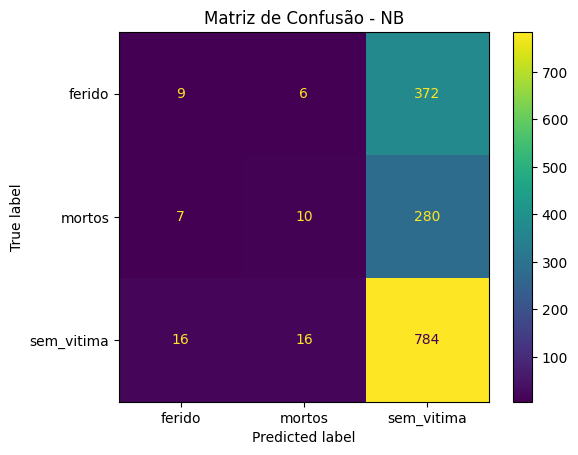

SVM: 0.3830 ± 0.0005

📌 Relatório de Classificação: SVM

              precision    recall  f1-score   support

      ferido       0.00      0.00      0.00       387
      mortos       0.00      0.00      0.00       297
  sem_vitima       0.54      1.00      0.70       816

    accuracy                           0.54      1500
   macro avg       0.18      0.33      0.23      1500
weighted avg       0.30      0.54      0.38      1500



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


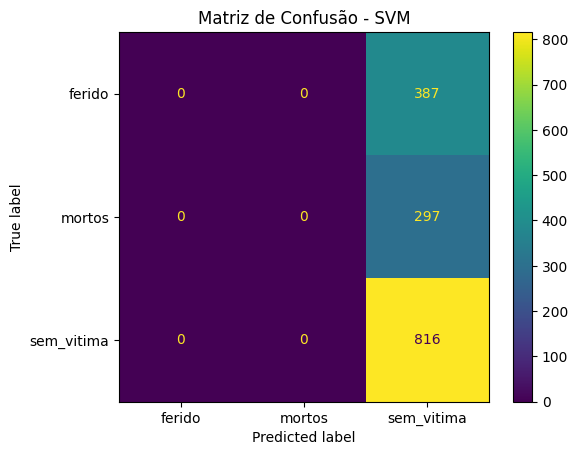

KNN: 0.4271 ± 0.0173

📌 Relatório de Classificação: KNN

              precision    recall  f1-score   support

      ferido       0.28      0.29      0.28       387
      mortos       0.25      0.17      0.20       297
  sem_vitima       0.58      0.64      0.61       816

    accuracy                           0.45      1500
   macro avg       0.37      0.36      0.36      1500
weighted avg       0.44      0.45      0.44      1500



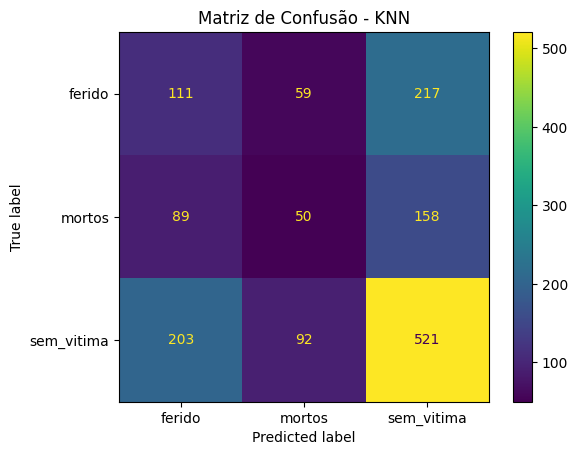

CART: 0.4248 ± 0.0248

📌 Relatório de Classificação: CART

              precision    recall  f1-score   support

      ferido       0.32      0.34      0.33       387
      mortos       0.24      0.28      0.26       297
  sem_vitima       0.61      0.56      0.59       816

    accuracy                           0.45      1500
   macro avg       0.39      0.39      0.39      1500
weighted avg       0.46      0.45      0.46      1500



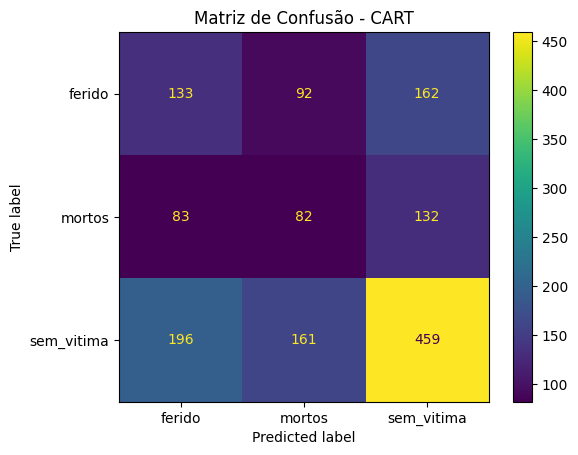

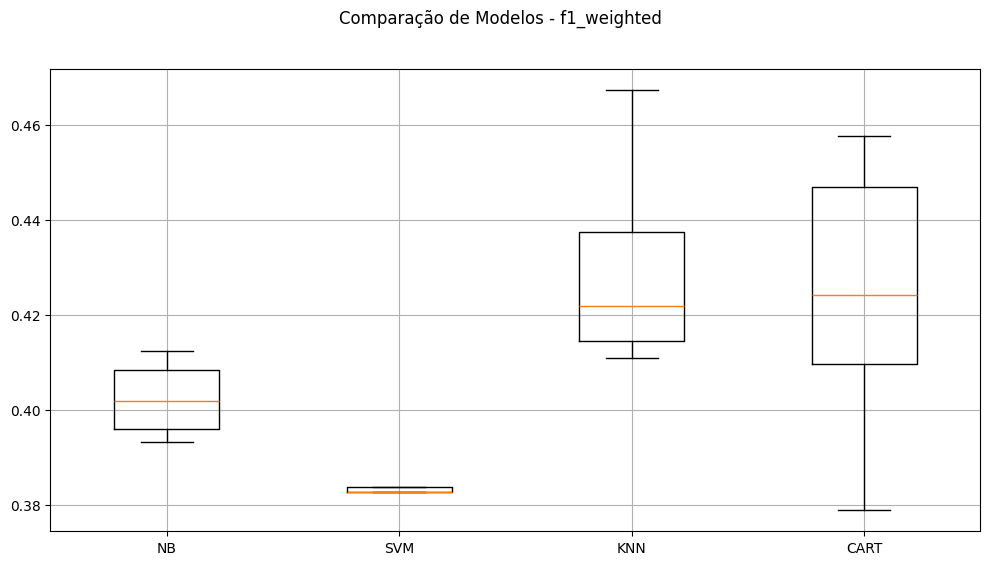

In [8]:
results, names, X_train, X_test, y_train, y_test, kfold = dt_original_f1 = gerar_analise('Dados Originais', 'f1_weighted', df_filtrado, seed)

#### Análise com um undersampling na classe sem vítimas e sem mortos para balancear com as outras.

📊 Tabela Resumo – Classificação Multiclasse (3 classes balanceadas) no menor valor de recorrência


| Modelo | f1\_weighted (±) | Accuracy | F1 Ferido | F1 Mortos | F1 Sem\_vitima | F1 Macro Avg | F1 Weighted Avg |
| ------ | ---------------- | -------- | --------- | --------- | -------------- | ------------ | --------------- |
| NB     | 0.3681 ± 0.0228  | 0.36     | 0.25      | 0.32      | 0.46           | 0.34         | 0.34            |
| SVM    | 0.3017 ± 0.0291  | 0.35     | 0.32      | 0.32      | 0.41           | 0.35         | 0.35            |
| KNN    | 0.3612 ± 0.0190  | 0.36     | 0.39      | 0.33      | 0.34           | 0.35         | 0.35            |
| CART   | 0.3537 ± 0.0260  | 0.38     | 0.38      | 0.34      | 0.41           | 0.37         | 0.37            |


### Tabela de F1-Score por Modelo e Classe

| Modelo | f1_weighted | Desvio Padrão | Accuracy | F1 Ferido | F1 Mortos | F1 Sem_vítima |
|--------|-------------|----------------|----------|-----------|-----------|----------------|
| NB     | 0.3542      | 0.0161         | 0.43     | 0.43      | 0.07      | 0.53           |
| SVM    | 0.2072      | 0.0007         | 0.38     | 0.00      | 0.00      | 0.55           |
| KNN    | 0.3487      | 0.0256         | 0.38     | 0.43      | 0.29      | 0.39           |
| CART   | 0.3855      | 0.0270         | 0.37     | 0.40      | 0.31      | 0.40           |

Baseado nesses resultados com o recall vou tentar umas melhorias no Gradient BOOST e no CART, ensinado na disciplina.


In [9]:
# Separar as classes
sem_vitimas = df_filtrado[df_filtrado['gravidade'] == 'sem_vitima']
sem_mortos = df_filtrado[df_filtrado['gravidade'] == 'ferido']
com_mortos = df_filtrado[df_filtrado['gravidade'] == 'mortos']

n_min =  2076 # reduzindo um pouco o tamanho da classe com mortos para balancear

df_balanceado = pd.concat([
    sem_vitimas.sample(n=n_min, random_state=7),
    sem_mortos,
    com_mortos
])


📊 Análise de Dados Balanceados - métrica: f1_weighted

NB: 0.3542 ± 0.0161

📌 Relatório de Classificação: NB

              precision    recall  f1-score   support

      ferido       0.42      0.44      0.43       388
      mortos       0.44      0.04      0.07       297
  sem_vitima       0.43      0.70      0.53       415

    accuracy                           0.43      1100
   macro avg       0.43      0.39      0.34      1100
weighted avg       0.43      0.43      0.37      1100



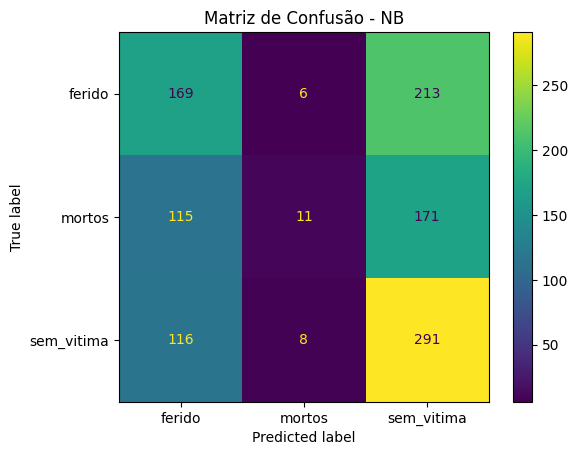

SVM: 0.2072 ± 0.0007

📌 Relatório de Classificação: SVM

              precision    recall  f1-score   support

      ferido       0.00      0.00      0.00       388
      mortos       0.00      0.00      0.00       297
  sem_vitima       0.38      1.00      0.55       415

    accuracy                           0.38      1100
   macro avg       0.13      0.33      0.18      1100
weighted avg       0.14      0.38      0.21      1100



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


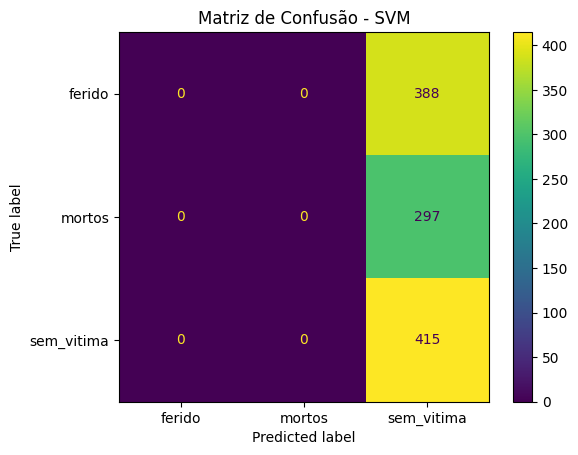

KNN: 0.3487 ± 0.0256

📌 Relatório de Classificação: KNN

              precision    recall  f1-score   support

      ferido       0.37      0.51      0.43       388
      mortos       0.31      0.28      0.29       297
  sem_vitima       0.46      0.34      0.39       415

    accuracy                           0.38      1100
   macro avg       0.38      0.38      0.37      1100
weighted avg       0.39      0.38      0.38      1100



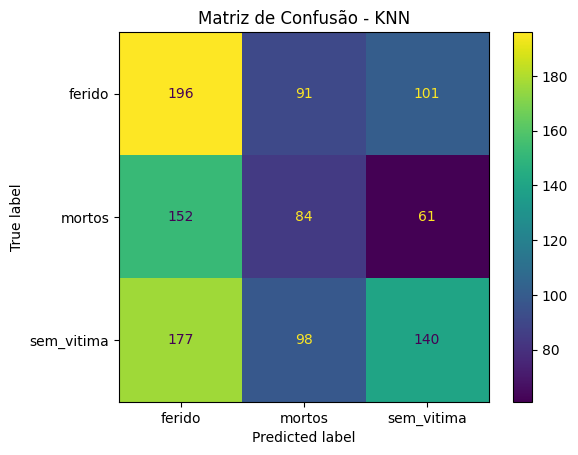

CART: 0.3863 ± 0.0252

📌 Relatório de Classificação: CART

              precision    recall  f1-score   support

      ferido       0.40      0.38      0.39       388
      mortos       0.31      0.33      0.32       297
  sem_vitima       0.40      0.40      0.40       415

    accuracy                           0.37      1100
   macro avg       0.37      0.37      0.37      1100
weighted avg       0.38      0.37      0.38      1100



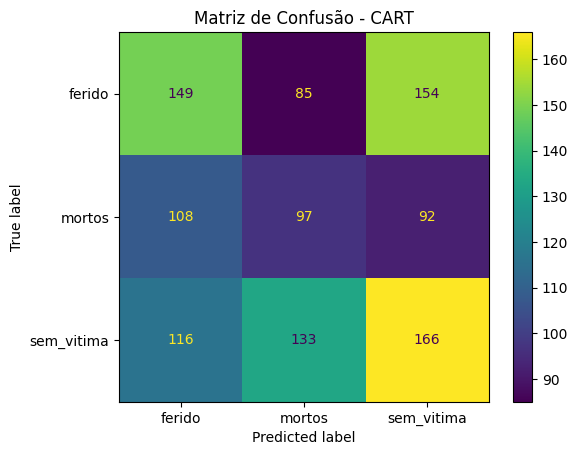

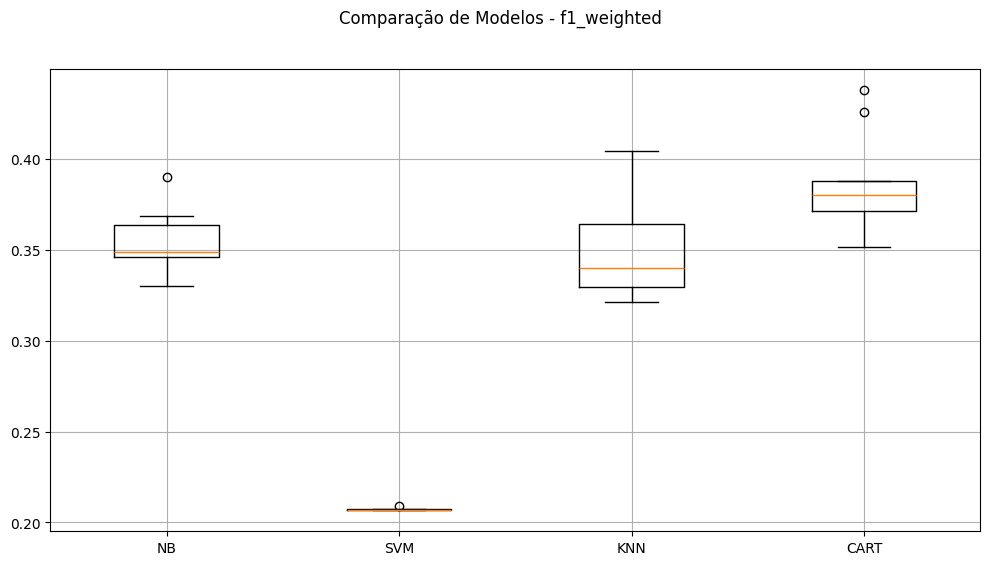

In [10]:
scoring = 'f1_weighted'
results, names, X_train, X_test, y_train, y_test, kfold = gerar_analise('Dados Balanceados', scoring, df_balanceado, seed)

#### Normalizando e Padronizando por modelo e por classe.


| Modelo    | `ferido` | `mortos` | `sem_vitima` | **F1-macro** | **Accuracy** |
| --------- | -------- | -------- | ------------ | ------------ | ------------ |
| KNN-orig  | 0.43     | 0.29     | 0.39         | 0.37         | 0.38         |
| CART-orig | 0.39     | 0.30     | 0.39         | 0.36         | 0.37         |
| NB-orig   | 0.43     | 0.07     | 0.53         | 0.34         | 0.43         |
| SVM-orig  | 0.00     | 0.00     | 0.55         | 0.18         | 0.38         |
| KNN-padr  | 0.42     | 0.29     | 0.39         | 0.37         | 0.38         |
| CART-padr | 0.40     | 0.31     | 0.38         | 0.37         | 0.37         |
| NB-padr   | 0.43     | 0.07     | 0.53         | 0.34         | 0.43         |
| SVM-padr  | 0.43     | 0.04     | 0.53         | 0.34         | 0.42         |
| KNN-norm  | 0.45     | 0.30     | 0.39         | 0.38         | 0.40         |
| CART-norm | 0.41     | 0.31     | 0.39         | 0.37         | 0.37         |
| NB-norm   | 0.43     | 0.07     | 0.53         | 0.34         | 0.43         |
| SVM-norm  | 0.43     | 0.04     | 0.52         | 0.33         | 0.42         |




/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


KNN-orig: 0.349 (0.026)
CART-orig: 0.389 (0.031)
NB-orig: 0.354 (0.016)
SVM-orig: 0.207 (0.001)
KNN-padr: 0.375 (0.020)
CART-padr: 0.381 (0.020)
NB-padr: 0.354 (0.016)
SVM-padr: 0.362 (0.014)
KNN-norm: 0.359 (0.022)
CART-norm: 0.378 (0.021)
NB-norm: 0.354 (0.016)
SVM-norm: 0.358 (0.011)

📌 Relatório de Classificação: KNN-orig

              precision    recall  f1-score   support

      ferido       0.37      0.51      0.43       388
      mortos       0.31      0.28      0.29       297
  sem_vitima       0.46      0.34      0.39       415

    accuracy                           0.38      1100
   macro avg       0.38      0.38      0.37      1100
weighted avg       0.39      0.38      0.38      1100


📌 Relatório de Classificação: CART-orig

              precision    recall  f1-score   support

      ferido       0.40      0.39      0.39       388
      mortos       0.29      0.31      0.30       297
  sem_vitima       0.40      0.39      0.39       415

    accuracy                  

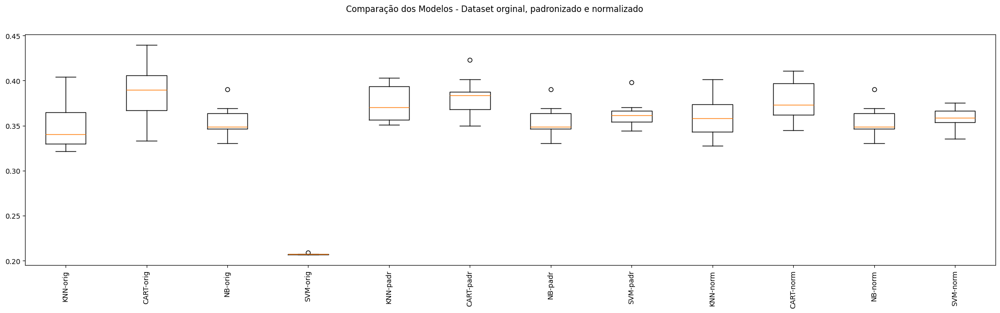

In [12]:
np.random.seed(7) # definindo uma semente global para este bloco

# Listas para armazenar os armazenar os pipelines e os resultados para todas as visões do dataset
pipelines = []
results = []
names = []


# Criando os elementos do pipeline

# Algoritmos que serão utilizados
knn = ('KNN', KNeighborsClassifier())
cart = ('CART', DecisionTreeClassifier())
naive_bayes = ('NB', GaussianNB())
svm = ('SVM', SVC())


# Transformações que serão utilizadas
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())


# Montando os pipelines

# Dataset original
pipelines.append(('KNN-orig', Pipeline([knn])))
pipelines.append(('CART-orig', Pipeline([cart])))
pipelines.append(('NB-orig', Pipeline([naive_bayes])))
pipelines.append(('SVM-orig', Pipeline([svm])))


# Dataset Padronizado
pipelines.append(('KNN-padr', Pipeline([standard_scaler, knn])))
pipelines.append(('CART-padr', Pipeline([standard_scaler, cart])))
pipelines.append(('NB-padr', Pipeline([standard_scaler, naive_bayes])))
pipelines.append(('SVM-padr', Pipeline([standard_scaler, svm])))

# Dataset Normalizado
pipelines.append(('KNN-norm', Pipeline([min_max_scaler, knn])))
pipelines.append(('CART-norm', Pipeline([min_max_scaler, cart])))
pipelines.append(('NB-norm', Pipeline([min_max_scaler, naive_bayes])))
pipelines.append(('SVM-norm', Pipeline([min_max_scaler, svm])))

msg_list = []
classification_list = []
# Executando os pipelines
for name, model in pipelines:
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %.3f (%.3f)" % (name, cv_results.mean(), cv_results.std()) # formatando para 3 casas decimais
    msg_list.append(msg)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    classification_list.append(f"\n📌 Relatório de Classificação: {name}\n")
    classification_list.append(classification_report(y_test, y_pred))

for msg in msg_list:
    print(msg)
for classification in classification_list:
    print(classification)

# Boxplot de comparação dos modelos
fig = plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos - Dataset orginal, padronizado e normalizado')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names, rotation=90)
plt.show()

In [ ]:
# Tuning do RF

np.random.seed(7) # definindo uma semente global para este bloco

pipelines = []

# Definindo os componentes do pipeline
rf = ('CART', DecisionTreeClassifier())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines.append(('CART-orig', Pipeline([rf])))
pipelines.append(('RF-padr', Pipeline([standard_scaler, rf])))
pipelines.append(('RF-norm', Pipeline([min_max_scaler, rf])))

param_grid = {
    'CART__criterion'                 : ['gini', 'entropy'],
    'CART__splitter'                  : ['best', 'random'],
    'CART__max_depth'                 : [None, 5, 10, 20, 30],
    'CART__min_samples_split'         : [2, 5, 10],
    'CART__min_samples_leaf'          : [1, 2, 4, 10],
    'CART__min_weight_fraction_leaf'  : [0.0, 0.1, 0.2],
    'CART__max_features'              : [None, 'sqrt', 'log2'],
    'CART__class_weight'              : [None, 'balanced'],
    'CART__ccp_alpha'                 : [0.0, 0.01, 0.1]
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # imprime a melhor configuração
    print("Sem tratamento de missings: %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

Sem tratamento de missings: CART-orig - Melhor: 0.403308 usando {'CART__ccp_alpha': 0.0, 'CART__class_weight': None, 'CART__criterion': 'gini', 'CART__max_depth': 10, 'CART__max_features': 'log2', 'CART__min_samples_leaf': 10, 'CART__min_samples_split': 2, 'CART__min_weight_fraction_leaf': 0.0, 'CART__splitter': 'best'}


#### Realizando o tuning

Baseado na tabela acima vai ser escolhido o o modelo GB com padronização dado o maior acerto

#### Criação do modelo

Baseado nos resultados do tuning será feita a análise.

In [ ]:
# Avaliação do modelo com o conjunto de testes
#Sem tratamento de missings: RF-padr - Melhor: 0.418391 usando {'RF__criterion': 'gini', 'RF__max_depth': None, 'RF__max_features': None, 'RF__min_samples_leaf': 4, 'RF__min_samples_split': 5, 'RF__n_estimators': 100}

# Preparação do modelo
scaler = MinMaxScaler().fit(X_train) # ajuste do scaler com o conjunto de treino
rescaledX = scaler.transform(X_train) # aplicação da padronização no conjunto de treino
model = RandomForestClassifier(criterion='gini', max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100) # ajuste do modelo com os melhores parâmetros
model.fit(rescaledX, y_train)

# Estimativa da acurácia no conjunto de teste
rescaledTestX = scaler.transform(X_test) # aplicação da padronização no conjunto de teste
predictions = model.predict(rescaledTestX)
print(accuracy_score(y_test, predictions))


0.3775280898876405


Modelo criado somente com a massa de teste

In [ ]:
# Preparação do modelo com TODO o dataset
scaler = MinMaxScaler().fit(X_train) # ajuste do scaler com TODO o dataset
rescaledX = scaler.transform(X_train) # aplicação da padronização com TODO o dataset
model.fit(rescaledX, y_train)

RandomForestClassifier(max_depth=20, max_features=None, min_samples_leaf=2)

In [ ]:
# Novos dados - não sabemos a classe!
data = {
    'weekday': [2, 3, 2],
    'month': [3, 7, 7],
    'period': [1, 2, 3],
    'latitude': [-22.960106, -22.964289, -22.9642353058],
    'longitude': [-43.169318,-43.183631, -43.1898117065]
}
df_treino = pd.DataFrame(data)
df_treino.head()
X_entrada = df_treino.iloc[:, 0:5].values

# Padronização nos dados de entrada usando o scaler utilizado em X
rescaledEntradaX = scaler.transform(X_entrada)
print(rescaledEntradaX)

[[0.33333333 0.18181818 0.         0.30382464 0.99427928]
 [0.5        0.54545455 0.33333333 0.28706847 0.9676714 ]
 [0.33333333 0.54545455 0.66666667 0.28728355 0.95618146]]


In [ ]:
saidas = model.predict(rescaledEntradaX)
print(saidas)

['sem_vitima' 'ferido' 'ferido']


In [ ]:
# Salva o modelo no disco
filename = 'model.pkl'
dump(model, open(filename, 'wb'))

df_X = pd.DataFrame(X_train, columns=['weekday', 'month', 'period', 'latitude', 'longitude'])
df_y = pd.Series(y_train, name='gravidade')
df_test = pd.concat([df_X, df_y], axis=1)
df_test.to_csv('test_completo.csv', index=False)

In [ ]:
from google.colab import files
files.download('model.pkl')
files.download('test_completo.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Conclusão
Fiz um algoritmo para consumir a API de dados do Fogo Cruzado que possui uma base bem completa com os dados de tiroteios de diversos municipios e selecionei o Rio de Janeiro como estudo. Após criar o algoritmo fiz a seguinte análise.

Como pré processamento dos dados fiz o parser dos dados de vítimas para poder ter o total de mortes/ total de vítimas, para dar a repetição dos eventos escolhi a data para poder tirar o dia da semana, o mês e o período do dia em que ocorre os eventos, como parâmetro de localização utilizei a latitude e longitude.

Devido a distribuição das vítimas e das mortes resolvi classificar apenas os eventos em sem vítimas (massivo), somente feridos (menor) e ter pelo menos uma morte (raro), que seria mais grave.

O dataset era extremamente desbalanceado com menos mortes (evento raro (UFA!))

Ao analisar os dados de operação policial notei que os tiroteios com vítimas sejam mortos ou feridos ficava mais balanceado, logo reduzi o problema para dado uma operação com tiroteio qual a chance de termos vítimas e com vítimas fatais.

Como o problema era de classificação com 3 classes, além do score adicionei uma matriz de confusão pra poder entender como estava o acerto pelas classes o que achei bem interessante. Cheguei até a colocar os dados de período como seno e conseno para ver se melhorava os scores, o que não subiu tanto a principio. Logo decidi colocar mais dois métodos de árvore o RandomForest e GradientBooster que achei um pouco melhor e deixei pra esse exemplo.

Um fato interessante é que após o balanceamento do dataset o assertividade em  outras classes melhorou fortemente ainda mais no KNN e NB. Apesar da accuracy como um todo ter baixado, não é interssante termos uma taxa de acerto baixa no evento drástico que seria com mortes, por isso esse foi o critério de observação na escolha do modelo maior accuracy e melhor no evento de com mortes.

Como próximos passos estava pensando em juntar a base do ISP e realizar o tratamento com responsavel pelo batalhão no período e o próprio batalhão dentro do dado do tiroteio, assim como colocar a população da região afetada para podermos avaliar se tem relação de melhora na acurácia.




